In [1]:
import os
import random

import numpy as np
import pandas as pd
import torch

from models.bilstm import BiLSTMSpam
from util import build_vocab, load_glove_embeddings
from explainability import explain_bilstm_with_lime, visualize_lime_explanation

In [2]:
ROOT_PATH = './'
DATA_PATH = os.path.abspath(os.path.join(ROOT_PATH, '../spam-detection-data/'))
DATA_PATH

'/home/michael/PycharmProjects/spam-detection-data'

In [3]:
GLOVE_PATH = os.path.join(DATA_PATH, 'data/raw/glove.6B/glove.6B.300d.txt')
GLOVE_PATH

'/home/michael/PycharmProjects/spam-detection-data/data/raw/glove.6B/glove.6B.300d.txt'

In [4]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

In [5]:
train_df = pd.read_pickle(DATA_PATH + '/data/processed/train.pkl')
test_df = pd.read_pickle(DATA_PATH + '/data/processed/test.pkl')

set_seed(42)
word2idx, idx2word = build_vocab(train_df['text'])
test_df.head()

,text,label,source
2523,re ilug dial on demand on wed aug 21 2002 at 0...,0,easy_ham_2
3820,satalk why false positives are twenty times wo...,0,easy_ham_2
1484,re sadev testing with less rules 98fc0c84b40c9...,0,easy_ham
4730,about the author written by corbb o connor cor...,1,spam_2
4991,call me 37661 hello i am your hot lil horny to...,1,spam_2


In [6]:
embedding_dim = 300
pretrained_embeddings = load_glove_embeddings(GLOVE_PATH, word2idx, embedding_dim)

In [7]:
model = BiLSTMSpam(vocab_size=len(word2idx), embedding_dim=300, pretrained_embeddings=pretrained_embeddings)
model.load(DATA_PATH + '/trained_models/spam_bilstm.pt')  # Load your trained model
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device = 'cpu'
model = model.to(device)
model.eval()

BiLSTMSpam(
  (embedding): Embedding(25373, 300)
  (lstm): LSTM(300, 128, num_layers=2, batch_first=True, dropout=0.5, bidirectional=True)
  (attention): Attention(
    (attn): Linear(in_features=256, out_features=1, bias=True)
  )
  (fc1): Linear(in_features=256, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=1, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

In [8]:
# Define a tokenizer for BiLSTM
max_len = 200  # or your preferred sequence length
def bilstm_tokenizer(text, max_len=max_len):
    idxs = [word2idx.get(token, word2idx['<UNK>']) for token in text.split()]
    if len(idxs) < max_len:
        idxs += [word2idx['<PAD>']] * (max_len - len(idxs))
    else:
        idxs = idxs[:max_len]
    return idxs

In [9]:
# Select sample texts to explain
sample_texts = test_df['text'].iloc[:10].tolist()

In [10]:
# Generate LIME explanations for BiLSTM
lime_explanations = explain_bilstm_with_lime(model, bilstm_tokenizer, max_len, device, sample_texts, num_samples=500)

In [11]:
# Visualize LIME explanations
for lime_exp, original_text in zip(lime_explanations, sample_texts):
    visualize_lime_explanation(lime_exp, original_text)

Original Text: 're ilug dial on demand on wed aug 21 2002 at 02 52 11pm 0800 133359ba82f002eb58fc8cb5aa5d7d5c3e4d1186ad3afafeff587705b9d474de wrote > could you please help me how to set up a dial on demand what are the > packages needed > and other requirements to get on depends on what you are using to dial for debian put demand in etc ppp peers use idle 600 to set the timeout to 10 minutes 600 secs im not sure where exactly to put it for other distros whereever pppd gets it options from regards ivan kelly a49daeedf18eb5a19316d94e598ad322553115a664538650783b42542927a00d begin geek code block gcs d s a c ul p l e w n o k w o m v ps pe y pgp t 5 x r tv b di d g e h r y end geek code block irish linux users group cedc3ff7c17273d37ade32eb42e386da12f6bc9f430f1b38ab9235ebc6b7e6ad <URL> for un subscription information list maintainer a9478f9dfebc43810f4395b92c142e37380ddbbfcc31f713f0395c669db27513'
Predicted Class: ham


Original Text: 'satalk why false positives are twenty times worse than false negatives <URL> e_display jsp vnu_content_id 1570036 or <URL> if that url wrapped rod if i was a front porch swing would you let me hang if i was a dancefloor would you shake your thang if i was a rubber check would you let me bounce up and down inside your bank account >> doing the blogging thang again at <URL> << this sf net email is sponsored by thinkgeek welcome to geek heaven <URL> _______________________________________________ spamassassin talk mailing list e11838b7c4c73ce7f1f9226966cf05a5e3bfb4675ad768587c9b4881ce2893ac <URL>'
Predicted Class: ham


Original Text: 're sadev testing with less rules 98fc0c84b40c9ac1a8f61f397a499ac0655ba4c2abcc6e503b364ee1f3749624 justin mason writes >>> date_in_past_48_96 >>> spam_phrase_00_01 >>> spam_phrase_01_02 >>> spam_phrase_02_03 >>> spam_phrase_03_05 >>> spam_phrase_05_08 > i was thinking of just removing those particular rules but keeping the > other entries in the range since they re proving too noisy to be > effective but i d be willing to keep those ones in all the same what > do you think matt craig thoughts i think i could handle commenting out the lowest spam_phrase_xx_yy scores if the ga could handle this sort of thing so they d automatically be zeroed i d feel better since the ranges could change next time the phrase list is regenerated or the algorithm tweaked i think we need to understand why date_in_past_48_96 is so low before we remove it the two rules on either side perform quite well >> and here are the rules that seem like they should be better or should >> be recoverable >>>

Original Text: 'about the author written by corbb o connor corbb is the webmaster of <URL> a website that focuses on teaching webmasters how to create gain traffic to and make money from their own websites he is also the editor of a free bi weekly newsletter entitled the guided webmaster to subscribe now send an email to mailto 632686a4dcce30a3a380a9479fac6613eb3b4de413d8ab83bd27e7077defd272 subject article subscribe information about this newsletter can be obtained from his website member showcase examine carefully those with email addresses included will trade links with you you are encouraged to contact them there are many ways to build a successful business just look at these successful sites programs other members are involved in life without debt what would you do with 5 000 10 000 20 000 100 000 a dream team of heavy hitters are gathering to promote life without debt get in now to receive massive spillover in the 2x matrix <URL> earn <CURRENCY> 000 per year fully guaranteed we d

Original Text: 'call me 37661 hello i am your hot lil horny toy i am the one you dream about i am a very open minded person love to talk about and any subject fantasy is my way of life ultimate in sex play ummmmmmmmmmmmmm i am wet and ready for you it is not your looks but your imagination that matters most with my sexy voice i can make your dream come true hurry up call me let me cummmmm for you for phone billing 1 900 993 2582 _______________________________________________ sign up for your own free personalized e mail at mail com <URL>'
Predicted Class: spam


Original Text: 're change of plans hello you two i am so sorry catherine for not writing recently i have just been vv busybeing a working mother and sometimes it all gets too much you know i cannot wait to see you both although we may meet at the airport on the 16 6 as that s the day we re going to france but i will see you both at bronagh s house for her 30th which we re going to on the way back from the airport i am so excited about seeing you liitle eva aine was born on tuesday she is absolutely incredible poor bronagh is 11 dsays over sounds like you ve been having an amazing time hope you won t be too depressed to be back lots of love deirdre justin mason wrote < < just a quick note < < we ve decided to go up to annapurna base camp instead of < the jomsom trek it s a bit more impressive visually < if a little soggier so as of tomorrow morning ourselves < and our guide bhadra will be leaping like gazelles up 4000 odd < metres into the himalayas we ll be sure to take a few < pics on

Original Text: '1 <URL> copyright 1997 2002 pudge all rights reserved you have received this message because you subscribed to it on use perl to stop receiving this and other messages from use perl or to add more messages or change your preferences please go to your user page <URL> you can log in and change your preferences from there'
Predicted Class: ham


Original Text: 'enron finance chief is handcuffed url <URL> business federal prosecutors in the us have filed charges against the highest ranking enron executive yet'
Predicted Class: ham


Original Text: 'spambayes test sets > i believe the spamassassin maintainers have a scheme whereby the corpus > of non spam is distributed ie several people have bodies of non spam > that they use for collectively evolving the sa score set if that > sounds vague it matches my level of understanding see if you can get a hold of that so we can do a level playing field competition guido van rossum home page <URL>'
Predicted Class: ham


Original Text: 'spambayes deployment > i wonder if the focus of spambayes ought not to be a classifier that > leaves the fetching and feeding of messages to auxillary code that > way it could be dropped into whatever harness that suited the > user s situation i see no reason to restrict the project to developing the classifier and leave the deployment to others attempts at deployment in the real world will surely provide additional feedback for the classifier guido van rossum home page <URL>'
Predicted Class: ham


In [12]:
from explainability import explain_bilstm_with_shap
device='cpu'
shap_values, tokenized_texts = explain_bilstm_with_shap(model, bilstm_tokenizer, sample_texts, max_len, device)

  0%|          | 0/10 [00:00<?, ?it/s]

Original Text: 're ilug dial on demand on wed aug 21 2002 at 02 52 11pm 0800 133359ba82f002eb58fc8cb5aa5d7d5c3e4d1186ad3afafeff587705b9d474de wrote > could you please help me how to set up a dial on demand what are the > packages needed > and other requirements to get on depends on what you are using to dial for debian put demand in etc ppp peers use idle 600 to set the timeout to 10 minutes 600 secs im not sure where exactly to put it for other distros whereever pppd gets it options from regards ivan kelly a49daeedf18eb5a19316d94e598ad322553115a664538650783b42542927a00d begin geek code block gcs d s a c ul p l e w n o k w o m v ps pe y pgp t 5 x r tv b di d g e h r y end geek code block irish linux users group cedc3ff7c17273d37ade32eb42e386da12f6bc9f430f1b38ab9235ebc6b7e6ad <URL> for un subscription information list maintainer a9478f9dfebc43810f4395b92c142e37380ddbbfcc31f713f0395c669db27513'
Predicted Class: ham


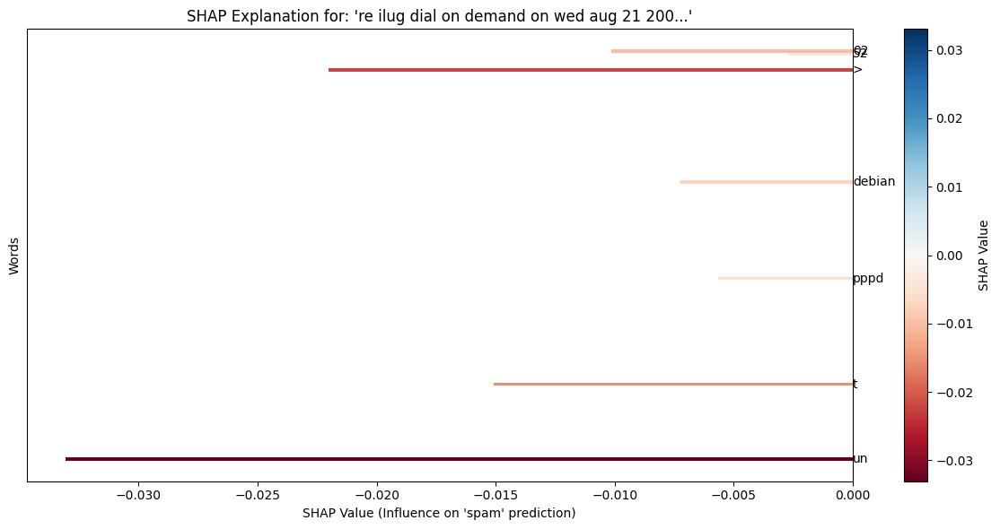

Original Text: 'satalk why false positives are twenty times worse than false negatives <URL> e_display jsp vnu_content_id 1570036 or <URL> if that url wrapped rod if i was a front porch swing would you let me hang if i was a dancefloor would you shake your thang if i was a rubber check would you let me bounce up and down inside your bank account >> doing the blogging thang again at <URL> << this sf net email is sponsored by thinkgeek welcome to geek heaven <URL> _______________________________________________ spamassassin talk mailing list e11838b7c4c73ce7f1f9226966cf05a5e3bfb4675ad768587c9b4881ce2893ac <URL>'
Predicted Class: ham


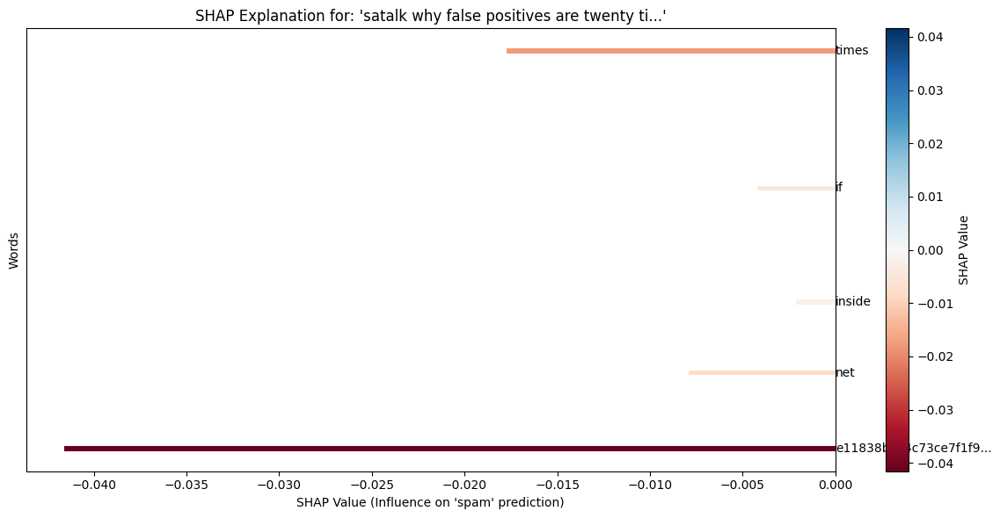

Original Text: 're sadev testing with less rules 98fc0c84b40c9ac1a8f61f397a499ac0655ba4c2abcc6e503b364ee1f3749624 justin mason writes >>> date_in_past_48_96 >>> spam_phrase_00_01 >>> spam_phrase_01_02 >>> spam_phrase_02_03 >>> spam_phrase_03_05 >>> spam_phrase_05_08 > i was thinking of just removing those particular rules but keeping the > other entries in the range since they re proving too noisy to be > effective but i d be willing to keep those ones in all the same what > do you think matt craig thoughts i think i could handle commenting out the lowest spam_phrase_xx_yy scores if the ga could handle this sort of thing so they d automatically be zeroed i d feel better since the ranges could change next time the phrase list is regenerated or the algorithm tweaked i think we need to understand why date_in_past_48_96 is so low before we remove it the two rules on either side perform quite well >> and here are the rules that seem like they should be better or should >> be recoverable >>>

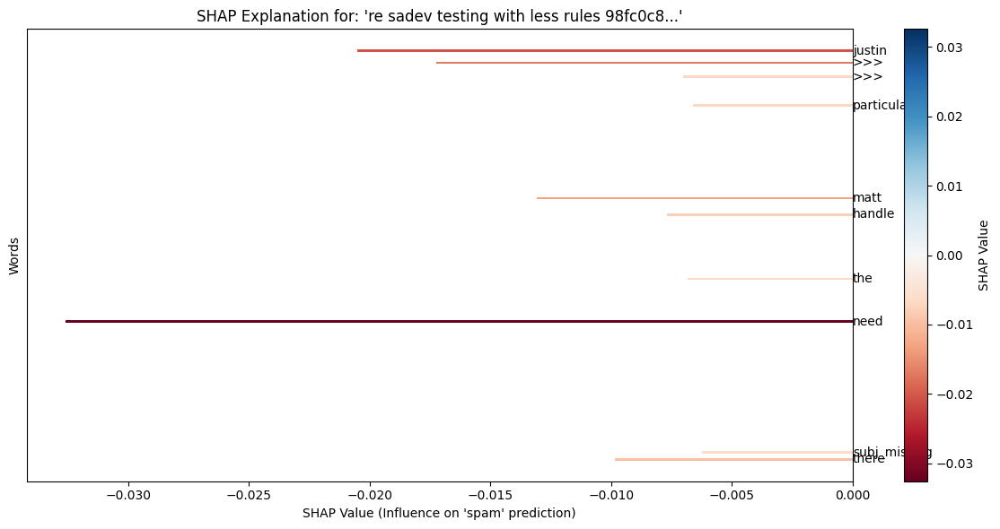

Original Text: 'about the author written by corbb o connor corbb is the webmaster of <URL> a website that focuses on teaching webmasters how to create gain traffic to and make money from their own websites he is also the editor of a free bi weekly newsletter entitled the guided webmaster to subscribe now send an email to mailto 632686a4dcce30a3a380a9479fac6613eb3b4de413d8ab83bd27e7077defd272 subject article subscribe information about this newsletter can be obtained from his website member showcase examine carefully those with email addresses included will trade links with you you are encouraged to contact them there are many ways to build a successful business just look at these successful sites programs other members are involved in life without debt what would you do with 5 000 10 000 20 000 100 000 a dream team of heavy hitters are gathering to promote life without debt get in now to receive massive spillover in the 2x matrix <URL> earn <CURRENCY> 000 per year fully guaranteed we d

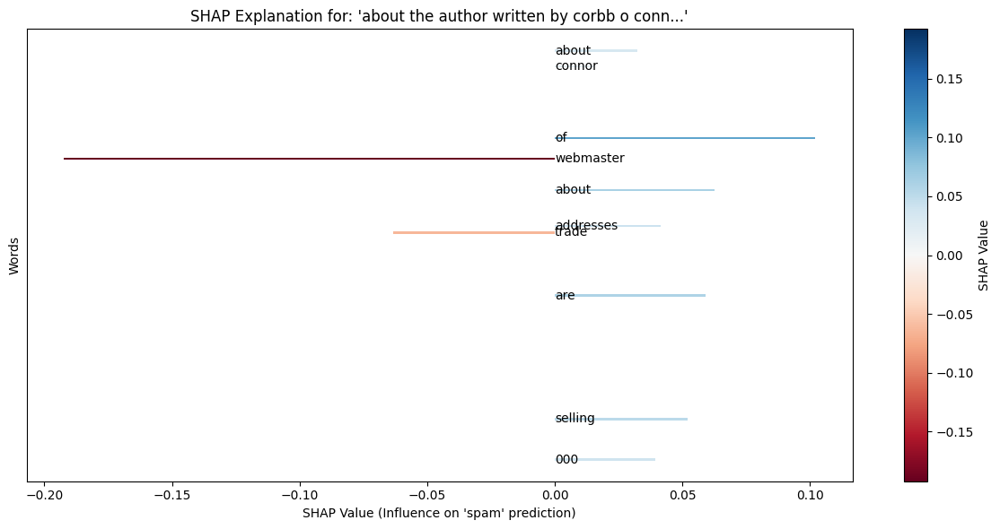

Original Text: 'call me 37661 hello i am your hot lil horny toy i am the one you dream about i am a very open minded person love to talk about and any subject fantasy is my way of life ultimate in sex play ummmmmmmmmmmmmm i am wet and ready for you it is not your looks but your imagination that matters most with my sexy voice i can make your dream come true hurry up call me let me cummmmm for you for phone billing 1 900 993 2582 _______________________________________________ sign up for your own free personalized e mail at mail com <URL>'
Predicted Class: ham


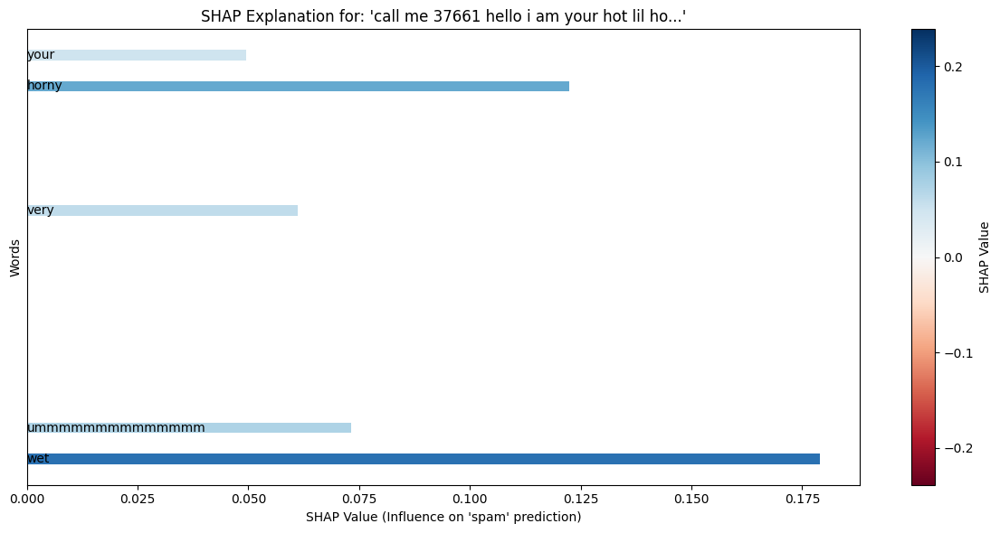

Original Text: 're change of plans hello you two i am so sorry catherine for not writing recently i have just been vv busybeing a working mother and sometimes it all gets too much you know i cannot wait to see you both although we may meet at the airport on the 16 6 as that s the day we re going to france but i will see you both at bronagh s house for her 30th which we re going to on the way back from the airport i am so excited about seeing you liitle eva aine was born on tuesday she is absolutely incredible poor bronagh is 11 dsays over sounds like you ve been having an amazing time hope you won t be too depressed to be back lots of love deirdre justin mason wrote < < just a quick note < < we ve decided to go up to annapurna base camp instead of < the jomsom trek it s a bit more impressive visually < if a little soggier so as of tomorrow morning ourselves < and our guide bhadra will be leaping like gazelles up 4000 odd < metres into the himalayas we ll be sure to take a few < pics on

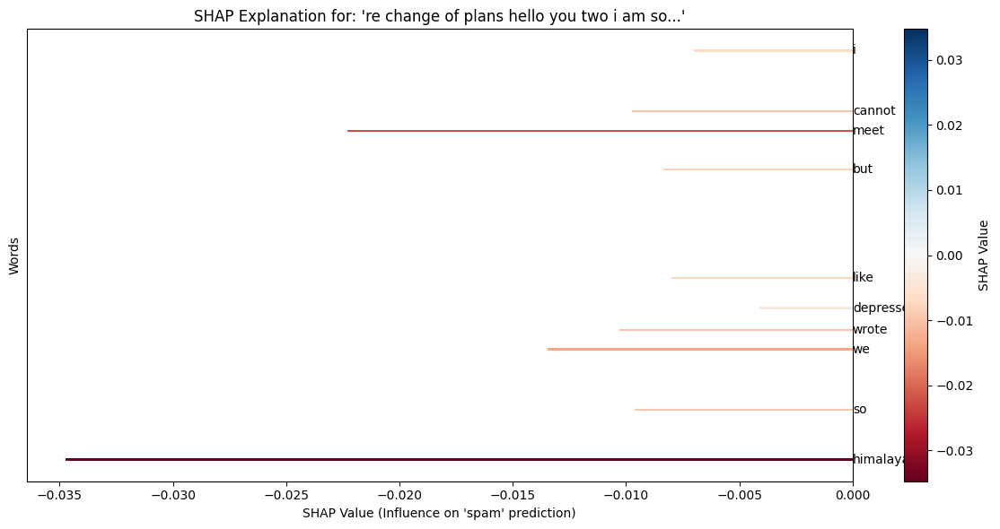

Original Text: '1 <URL> copyright 1997 2002 pudge all rights reserved you have received this message because you subscribed to it on use perl to stop receiving this and other messages from use perl or to add more messages or change your preferences please go to your user page <URL> you can log in and change your preferences from there'
Predicted Class: ham


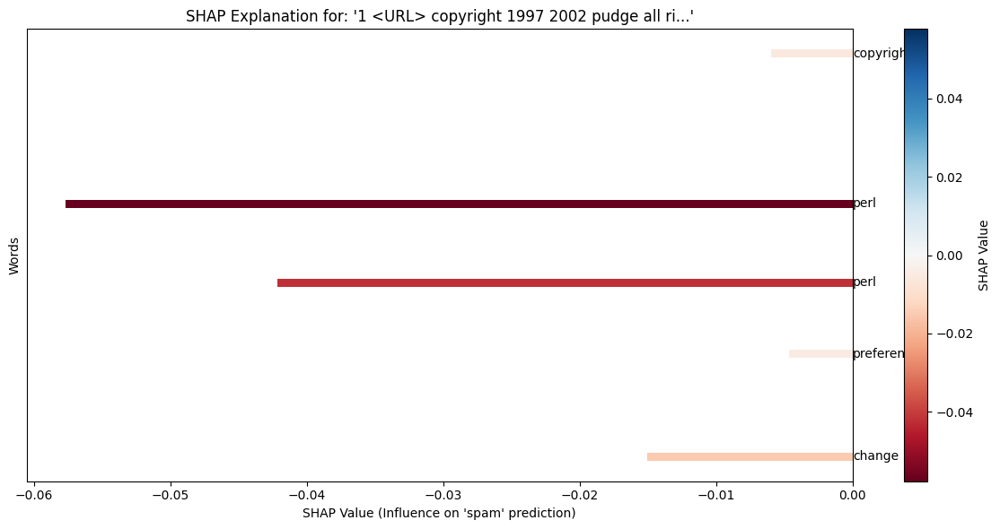

Original Text: 'enron finance chief is handcuffed url <URL> business federal prosecutors in the us have filed charges against the highest ranking enron executive yet'
Predicted Class: ham


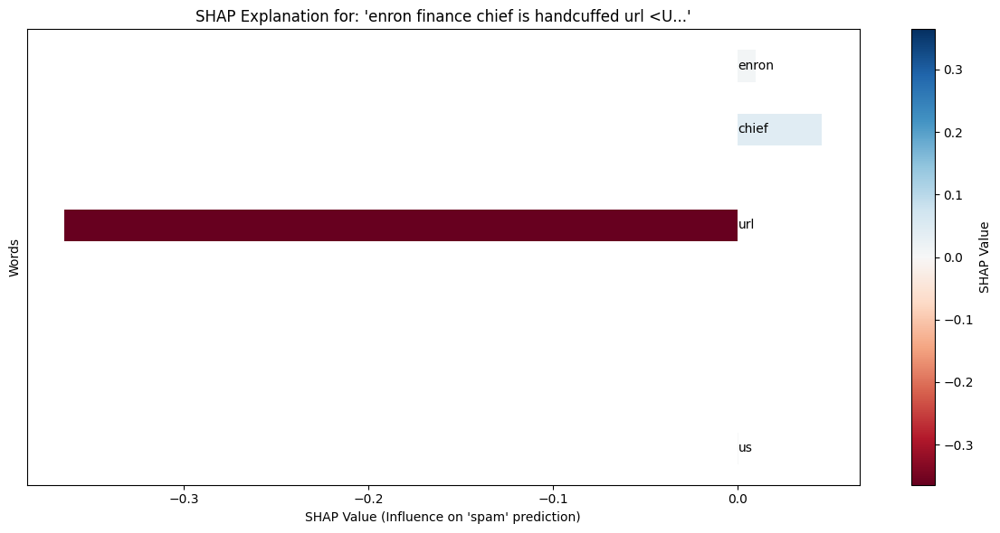

Original Text: 'spambayes test sets > i believe the spamassassin maintainers have a scheme whereby the corpus > of non spam is distributed ie several people have bodies of non spam > that they use for collectively evolving the sa score set if that > sounds vague it matches my level of understanding see if you can get a hold of that so we can do a level playing field competition guido van rossum home page <URL>'
Predicted Class: ham


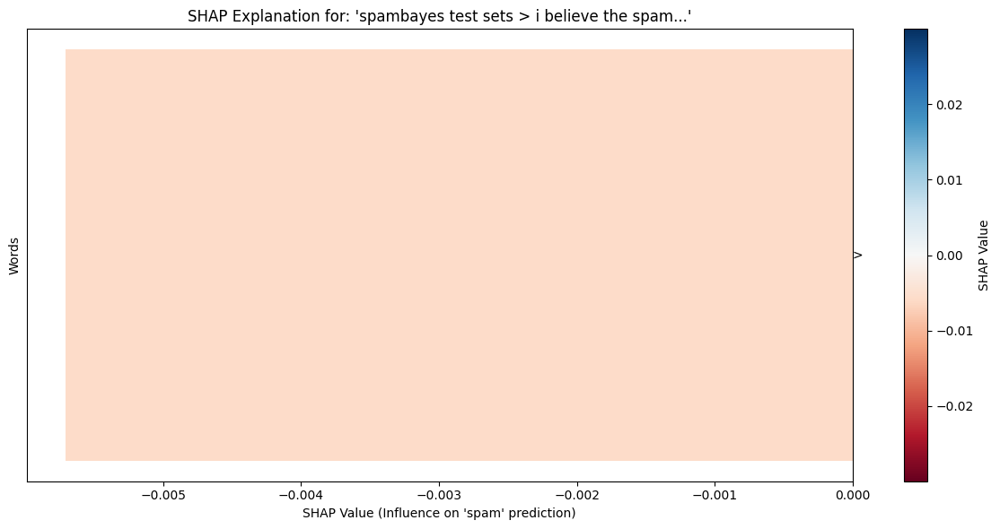

Original Text: 'spambayes deployment > i wonder if the focus of spambayes ought not to be a classifier that > leaves the fetching and feeding of messages to auxillary code that > way it could be dropped into whatever harness that suited the > user s situation i see no reason to restrict the project to developing the classifier and leave the deployment to others attempts at deployment in the real world will surely provide additional feedback for the classifier guido van rossum home page <URL>'
Predicted Class: ham


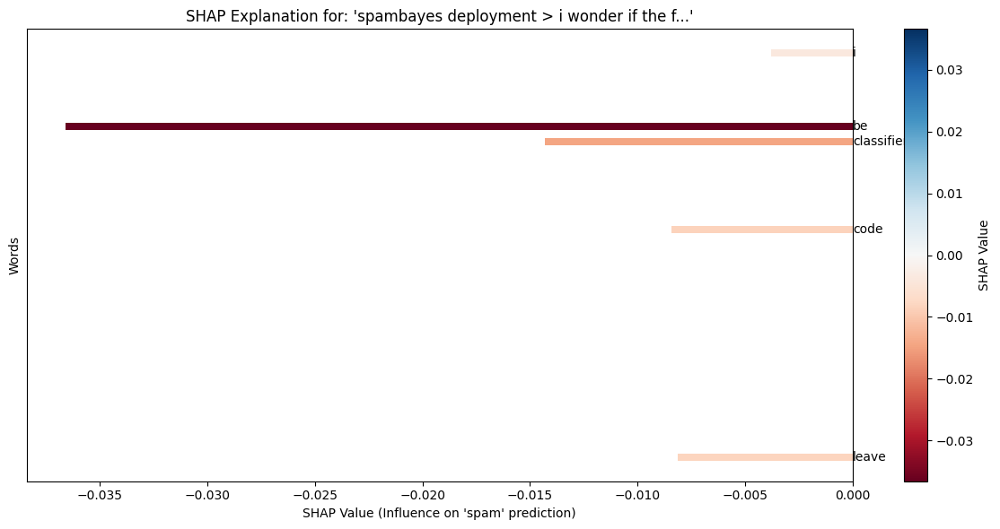

In [13]:
from explainability import visualize_shap_for_sample

# Visualize SHAP for each sample in the batch
for shap_explanation, original_text in zip(shap_values, sample_texts):
    visualize_shap_for_sample(shap_explanation, original_text)